本项目是为完成kaggle竞赛题(Dogs vs. Cats Redux: Kernels Edition)而作，题目地址：https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition

In [1]:
import os
import cv2
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import torch
import torch.nn as nn
from torchvision import transforms, models
import matplotlib.pyplot as plt
%matplotlib inline

一、数据预处理  

1、读取/train下的文件，并根据文件名判断标签。

In [2]:
data_dir='./dataset/' #数据目录
train_dir=os.path.join(data_dir,'train') #训练集文件夹
image_names=os.listdir(train_dir) #训练集文件名

#把dog和cat分装到两个列表dogs和cats，并附加标签
dogs,cats=[],[]
for fn in image_names:
    dogs.append((os.path.join(train_dir,fn),1)) if 'dog' in fn else cats.append((os.path.join(train_dir,fn),0))

2、可视化训练集数据分布

In [3]:
cats_size=pd.DataFrame([cv2.imread(cat[0],0).shape for cat in cats],columns=['h','w'])
dogs_size=pd.DataFrame([cv2.imread(dog[0],0).shape for dog in dogs],columns=['h','w'])

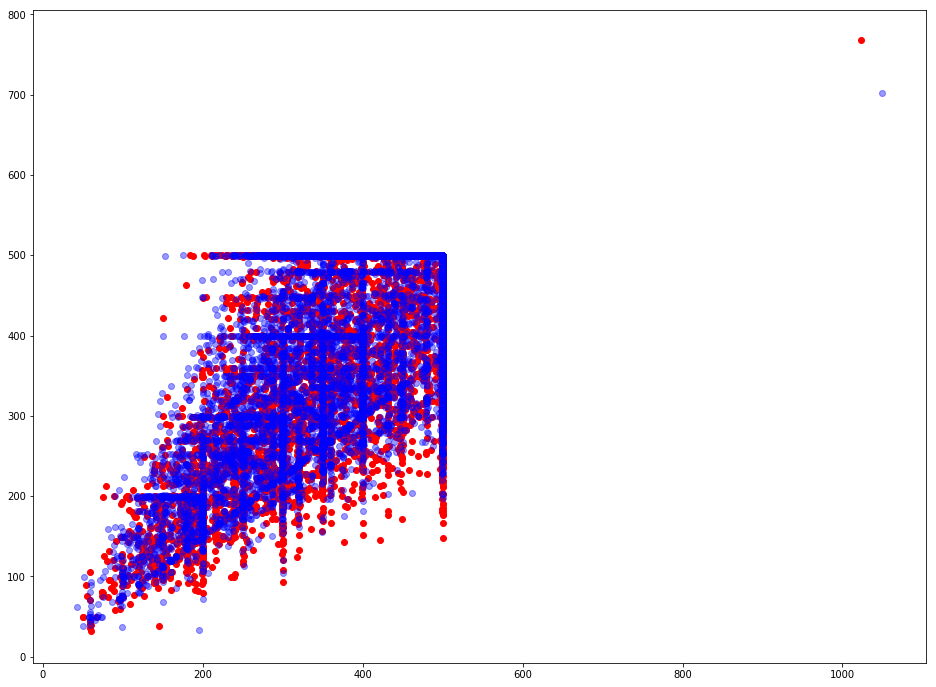

In [4]:
plt.figure(figsize=(16,12))
plt.scatter(cats_size['w'],cats_size['h'],c='red')
plt.scatter(dogs_size['w'],dogs_size['h'],c='blue',alpha=0.4)

2.1、从散点图可以直观看出，在右上角，猫狗各有一个异常点，下面我们看看尺寸异常的图片是哪两张。

In [5]:
big_cats=cats_size[cats_size['w']>800]
big_dogs=dogs_size[dogs_size['w']>800]
print(f'big_cats:\n{big_cats}\n\nbig_dogs:\n{big_dogs}')

big_cats:
        h     w
9678  768  1023

big_dogs:
        h     w
2959  702  1050


2.2、将尺寸异常的图片可视化。可以看出这两张其实都是正常猫狗图片，图片压缩后对模型训练没有影响。

Text(0.5,0,'./dataset/train/dog.2317.jpg')

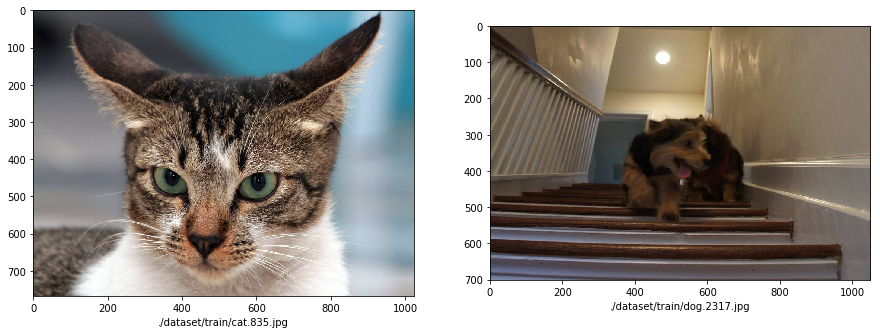

In [6]:
big_cat=cats[int(big_cats.index.values)][0]
big_dog=dogs[int(big_dogs.index.values)][0]

plt.figure(figsize=(15,12))
plt.subplot(121)
plt.imshow(plt.imread(big_cat))
plt.xlabel(big_cat)
plt.subplot(122)
plt.imshow(plt.imread(big_dog))
plt.xlabel(big_dog)

3、分割训练集和验证集。为保证数据平衡，训练集取数量相等的猫和狗，即猫狗各占50%。

In [3]:
#取80%的样本作为训练集
sample_size=0.8
#分割训练集和验证集
train_dogs,valid_dogs=train_test_split(dogs,train_size=sample_size,random_state=42,shuffle=True)
train_cats,valid_cats=train_test_split(cats,train_size=sample_size,random_state=42,shuffle=True)
train_sets=train_dogs+train_cats
valid_sets=valid_dogs+valid_cats
train_size=len(train_sets)
valid_size=len(valid_sets)

print('train_sets: %d, including:%d dogs and %d cats.\nvalid_sets: %d, including:%d dogs and %d cats.'
      %(train_size,len(train_dogs),len(train_cats),valid_size,len(valid_dogs),len(valid_cats)))

train_sets: 20000, including:10000 dogs and 10000 cats.
valid_sets: 5000, including:2500 dogs and 2500 cats.


/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


4、创建transform。训练集transforms使用随机裁剪、翻转来增强数据，测试集则直接使用中心裁剪。

In [4]:
transform={
'train':transforms.Compose([transforms.Resize(256),
                            transforms.RandomCrop(224),
                            transforms.RandomHorizontalFlip(),
                            transforms.ToTensor(),
                            transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))]),
'test':transforms.Compose([transforms.Resize(224),
                           transforms.CenterCrop(224),
                           transforms.ToTensor(),
                           transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])}

5、定义batch变换函数batch_transform。读取一个batch的文件路径，输出(batch,channel,height,width)

In [5]:
#read the image, return the input of model
def batch_transform(paths,transform):
    return torch.cat(tuple(transform(Image.open(path)).unsqueeze(0) for path in paths))

6、展示transform后的图片。

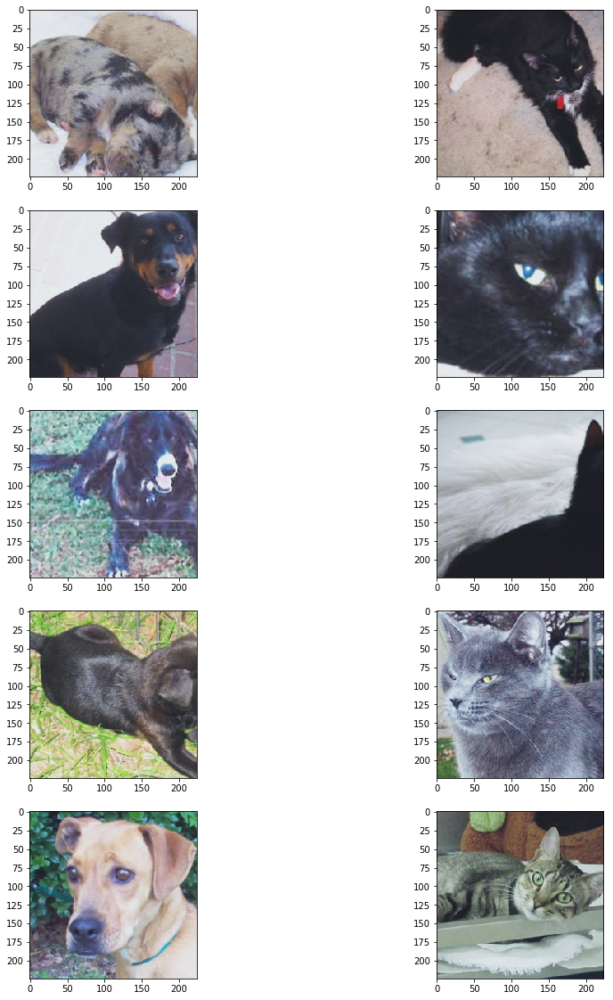

In [13]:
#展示转换图像的函数
def trans_images_show(datasets,transform):
    trans4plot=[torch.sigmoid(transform(Image.open(path))).permute(1,2,0) for path,_ in datasets]
    size=len(trans4plot)
    fig,ax=plt.subplots(int(size/2),2,figsize=(15,size*2))
    for i in range(size):
        row,col=(i,0) if i<size/2 else (int(i-size/2),1)
        ax[row,col].imshow(trans4plot[i])
        
#展示转换后的图片
trans_images_show(train_dogs[:5]+train_cats[:5],transform['train'])

二、搭建网络  

1、以densenet161为基准模型，冻结除classifier以外所有层的参数，修改classifier为最简单的全连接结构nn.Linear(in_features,2)，输出维度2的向量，对应两个分类类别。

In [6]:
#冻结除classifier以外的所有参数
model=models.densenet161(pretrained=True)
for param in model.parameters():
    param.requires_grad=False
in_features=model.classifier.in_features
model.classifier=nn.Linear(in_features,2)

#将model移至GPU加快训练速度
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model=model.to(device)

/opt/conda/lib/python3.6/site-packages/torchvision-0.2.1-py3.6.egg/torchvision/models/densenet.py:212: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.


2、损失函数

In [7]:
criterion=nn.CrossEntropyLoss().cuda() if torch.cuda.is_available() else nn.CrossEntropyLoss()

3、优化器  

由于要进行两次训练，在训练模型之前再分别定义。

三、训练网络  

1、准备训练参数

In [8]:
epochs=2
every=4
epoch_dict={'loss':{'train':[],'valid':[]},'acc':{'train':[],'valid':[]}}
running={'loss':{'train':[],'valid':[]},'acc':{'train':[],'valid':[]}}

2、用Adam优化器训练classifier。

In [9]:
optimizer=torch.optim.Adam(model.classifier.parameters())

3、DataLoader

In [10]:
train_batch=50
train_loader=torch.utils.data.DataLoader(train_sets,batch_size=train_batch,shuffle=True,num_workers=4)

4、用修改后的densenet161学习训练集

In [11]:
for epoch in range(1,epochs+1):
    count=0
    running_loss=0
    running_acc=0
    
    #train
    model.train()
    for paths,labels in train_loader:
        inputs=batch_transform(paths,transform['train'])
        inputs=inputs.to(device)
        optimizer.zero_grad()
        outputs=model(inputs)
        labels=labels.to(device)
        loss=criterion(outputs,labels)
        loss.backward()
        optimizer.step()
        running_loss+=loss.item()
        train_acc=accuracy_score(torch.argmax(outputs,dim=1),labels)
        running_acc+=train_acc

        count+=1
        print('epoch:%d, training:%d/%d, loss:%.6f, accuracy:%.4f\r'%(epoch,train_batch*count,train_size,loss,train_acc),end='')
        if count%every==0:
            average_loss=running_loss/every #every个batch的平均loss
            average_acc=running_acc/every #every个batch的平均accuracy
            print('epoch:%d, training:%d/%d, average_loss:%.6f, accuracy:%.4f\r'
                  %(epoch,train_batch*count,train_size,average_loss,average_acc))
            running['loss']['train'].append(average_loss)
            running['acc']['train'].append(average_acc)
            running_loss=0
            running_acc=0
            
    e_count=int(count/every)
    e_train_loss=sum(running['loss']['train'][-e_count:])/e_count
    e_train_acc=sum(running['acc']['train'][-e_count:])/e_count
    print('\nepoch %d, average training loss:%.6f ; training accuracy:%.4f'%(epoch,e_train_loss,e_train_acc))
    epoch_dict['loss']['train'].append(e_train_loss)
    epoch_dict['acc']['train'].append(e_train_acc)
    torch.save(model.state_dict(),'./Net-try-%s.pkl'%epoch)
    torch.save(running,'./running-try-%s.pkl'%epoch)
    torch.save(epoch_dict,'./epoch_dict-try-%s.pkl'%epoch)

epoch:1, training:200/20000, average_loss:0.660103, accuracy:0.5900
epoch:1, training:400/20000, average_loss:0.460932, accuracy:0.8800
epoch:1, training:600/20000, average_loss:0.317160, accuracy:0.9650
epoch:1, training:800/20000, average_loss:0.256312, accuracy:0.9650
epoch:1, training:1000/20000, average_loss:0.183150, accuracy:0.9750
epoch:1, training:1200/20000, average_loss:0.191542, accuracy:0.9650
epoch:1, training:1400/20000, average_loss:0.151279, accuracy:0.9600
epoch:1, training:1600/20000, average_loss:0.137197, accuracy:0.9650
epoch:1, training:1800/20000, average_loss:0.103299, accuracy:0.9800
epoch:1, training:2000/20000, average_loss:0.122549, accuracy:0.9650
epoch:1, training:2200/20000, average_loss:0.077602, accuracy:0.9900
epoch:1, training:2400/20000, average_loss:0.103022, accuracy:0.9600
epoch:1, training:2600/20000, average_loss:0.088465, accuracy:0.9800
epoch:1, training:2800/20000, average_loss:0.098651, accuracy:0.9800
epoch:1, training:3000/20000, average_

5、可视化训练过程评价指标

Text(0.5,1,'epoch accuracy')

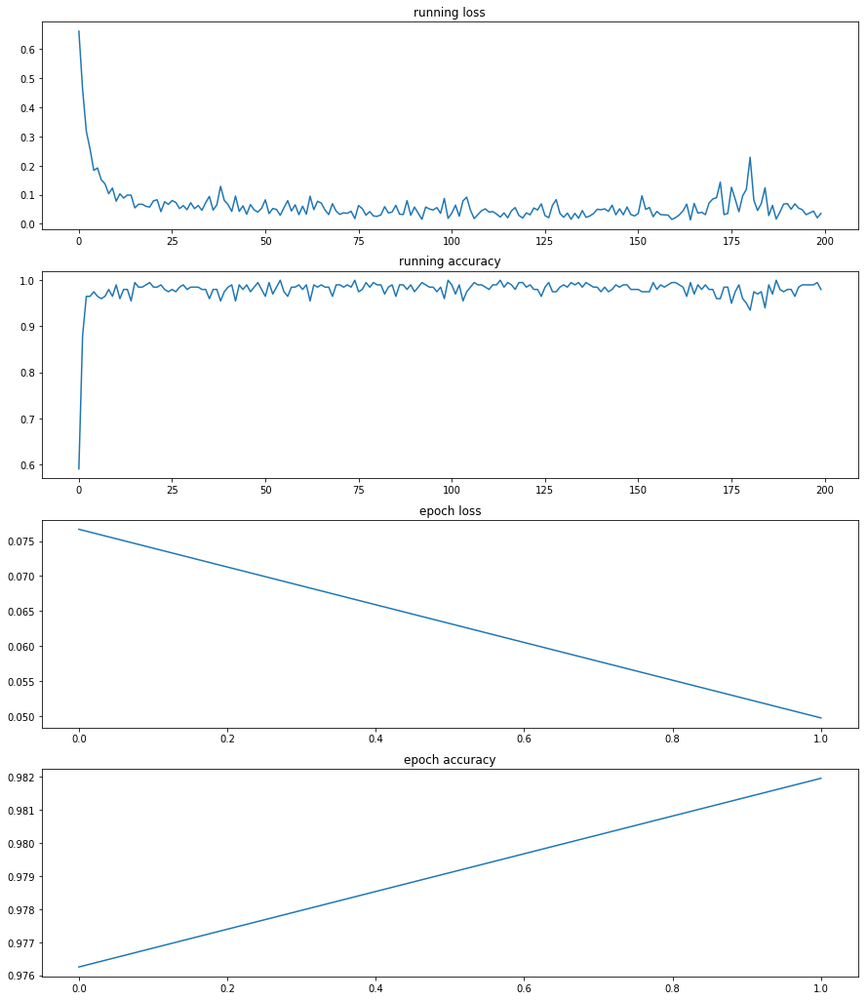

In [12]:
fig,ax=plt.subplots(4,1,figsize=(15,18))

ax[0].plot(running['loss']['train'])
ax[0].set_title('running loss')

ax[1].plot(running['acc']['train'])
ax[1].set_title('running accuracy')

ax[2].plot(epoch_dict['loss']['train'])
ax[2].set_title('epoch loss')

ax[3].plot(epoch_dict['acc']['train'])
ax[3].set_title('epoch accuracy')

6、用训练过的模型预测一次训练集样本，筛出loss大于阈值的样本。  
因为训练集绝大部分都是正常图片，异常的只占很小一部分，经过两轮epoch训练，模型准确率已达98%，学到的特征偏向于占绝对优势的正常图片，而此时loss仍然大于1.2040（预测正确的概率不超过30%）的，属于比较难学的样本，其中不乏一些异常图片，标签错误、非猫非狗、像素模糊、颜色深暗、背景复杂、角度刁钻，或者一张图同时存在猫和狗。  
这种方法不能作为筛选异常值的标准方法，但是可以辅助人工初步筛选一次异常值。

In [20]:
#normal_sets存放正常样本，outliers存放异常样本
normal_sets,outliers=[],[]

#重新定义train_loader，预测不需要shuffle。
train_loader=torch.utils.data.DataLoader(train_sets,batch_size=train_batch,num_workers=4)

model.eval()
for paths,labels in train_loader:
    inputs=batch_transform(paths,transform['test'])
    inputs=inputs.to(device)
    outputs=model(inputs)
    labels=labels.to(device)
    
    #将每个样本的output和label单独输入损失函数计算loss，并根据loss判断样本应该放入哪个list。
    outputs_tup=outputs.split(1,0)
    labels_tup=labels.split(1,0)
    
    for i in range(len(outputs_tup)):
        loss=criterion(outputs_tup[i],labels_tup[i])
        if loss.item()<1.2040:
            normal_sets.append((paths[i],labels[i].item()))
            print('normal loss: %.6f\r'%loss,end='')
        else:
            outliers.append((paths[i],labels[i].item(),loss.item()))
            print('outlier loss: %.6f'%loss)

#分别保存两个list
torch.save(normal_sets,'<1.2040_normal_sets.pkl')

#按loss从大到小排序
sorted_outliers=sorted(outliers,key=lambda x:x[2],reverse=True)
torch.save(sorted_outliers,'<1.2040_sorted_outliers.pkl')

print('%d images are normal, %d images may be outliers.'%(len(normal_sets),len(sorted_outliers)))

outlier loss: 1.509454
outlier loss: 1.697497
outlier loss: 1.983706
outlier loss: 2.704451
outlier loss: 2.425821
outlier loss: 2.629531
outlier loss: 3.563438
outlier loss: 1.383733
outlier loss: 1.788389
outlier loss: 2.149135
outlier loss: 1.744220
outlier loss: 3.196871
outlier loss: 1.561805
outlier loss: 3.063390
outlier loss: 1.441730
outlier loss: 1.475557
outlier loss: 1.471409
outlier loss: 1.512517
outlier loss: 1.406478
outlier loss: 1.338648
outlier loss: 1.230374
outlier loss: 1.347018
outlier loss: 4.540703
outlier loss: 2.345157
outlier loss: 2.435589
outlier loss: 1.207839
outlier loss: 1.314494
outlier loss: 1.503138
outlier loss: 3.541270
outlier loss: 1.773587
outlier loss: 2.448598
outlier loss: 1.461868
outlier loss: 1.478319
outlier loss: 2.786649
outlier loss: 1.677012
outlier loss: 2.630270
outlier loss: 2.988633
outlier loss: 2.700676
outlier loss: 1.362325
outlier loss: 1.821468
outlier loss: 6.278396
outlier loss: 3.052784
outlier loss: 1.226005
outlier los

In [8]:
# normal_sets=torch.load('<1.2040_normal_sets.pkl')
# sorted_outliers=torch.load('<1.2040_sorted_outliers.pkl')

7、展示loss大于阈值的图片

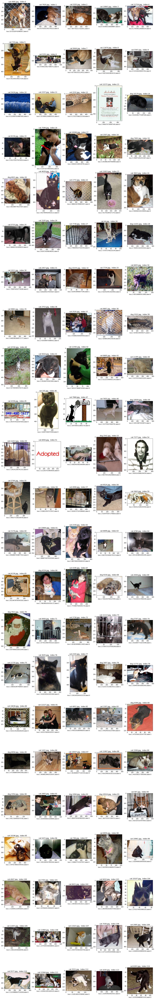

In [11]:
from math import ceil

len_outliers=len(sorted_outliers)
fig,axes=plt.subplots(ceil(len_outliers/5),5,figsize=(20,ceil(len_outliers/5)*6))
for i in range(len_outliers):
    ax=axes[i//5,i%5]
    img_path=sorted_outliers[i][0]
    ax.imshow(Image.open(img_path))
    ax.set_title(f'{os.path.basename(img_path)},  index:{i}')
    ax.set_xlabel(f'loss:{sorted_outliers[i][2]},label:{sorted_outliers[i][1]}')

8、人工对这些筛选出来的图片再检查一遍  



①修改标签错误的样本。比如第一张，实际为dog被标记为cat，并移回正常训练集。  
②黑猫黑狗相对难以辨认，但如果图片是清晰且正常的，应该移回正常训练集。  
③如果连人工都难以辨认的应该予以剔除。  

人工检查结果：  
标记错误：index=[0]  
难学但正常：indices=[26,30,46,48,53,57,58,64,65,77,86,88,89,94,98,100,107,108,110,112]  
其余的异常图片丢弃

In [9]:
#修改错误的标签
normal_sets.append((sorted_outliers[0][0],1))
#移回正常的图片
indices=[26,30,46,48,53,57,58,64,65,77,86,88,89,94,98,100,107,108,110,112]
for i in indices:
    normal_sets.append((sorted_outliers[i][0],sorted_outliers[i][1]))
    
train_size=len(normal_sets)
print(f'人工筛选后训练集还有{train_size}个样本。')

9、再次修改model.classifier，使用更复杂的全连接神经网络，并打开model后面几层的参数训练。

In [9]:
#重新修改model的classifier
model.classifier=nn.Sequential(nn.Dropout(0.2),
                               nn.Linear(in_features,int(in_features/2)),
                               nn.ReLU(),
                               nn.Dropout(0.2),
                               nn.Linear(int(in_features/2),int(in_features/4)),
                               nn.ReLU(),
                               nn.Dropout(0.2),
                               nn.Linear(int(in_features/4),int(in_features/8)),
                               nn.ReLU(),
                               nn.Dropout(0.2),
                               nn.Linear(int(in_features/8),2))
model=model.to(device)

#打开model后面几层的参数训练((144+2+8)个)
for i,param in enumerate(model.parameters()):
    if i>335:
        param.requires_grad=True

10、正式训练使用随机梯度下降算法SGD作为optimizer，训练denseblock4、norm5、classifier几层的参数。

In [12]:
init_lr=0.01  #起步learning rate

optimizer=torch.optim.SGD([{'params':model.classifier.parameters()},
                           {'params':model.features.norm5.parameters(),'lr':init_lr*0.1},
                           {'params':model.features.denseblock4.parameters(),'lr':init_lr*0.1}],
                          lr=init_lr,momentum=0.91)

#根据每个epoch的validation loss判断是否衰减learning rate
scheduler=torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,'min',patience=2)

11、用清洗过的数据集创建新的train_loader

In [13]:
train_batch,valid_batch=64,64
train_loader=torch.utils.data.DataLoader(normal_sets,batch_size=train_batch,shuffle=True,num_workers=4,drop_last=True)
valid_loader=torch.utils.data.DataLoader(valid_sets,batch_size=valid_batch,shuffle=True,num_workers=4,drop_last=True)

12、准备第二次训练（正式训练）

In [14]:
epochs=8
every=4 #每every次，暂停训练，进行一次验证
epoch_dict={'loss':{'train':[],'valid':[]},'acc':{'train':[],'valid':[]}}
running={'loss':{'train':[],'valid':[]},'acc':{'train':[],'valid':[]}}

In [15]:
#用清洗过的训练集训练模型
for epoch in range(1,epochs+1):
    count=0
    running_loss=0
    running_acc=0
    valid_iter=iter(valid_loader)
    
    #train
    model.train()
    for paths,labels in train_loader:
        inputs=batch_transform(paths,transform['train'])
        inputs=inputs.to(device)
        optimizer.zero_grad()
        outputs=model(inputs)
        labels=labels.to(device)
        loss=criterion(outputs,labels)
        loss.backward()
        optimizer.step()
        running_loss+=loss.item()
        train_acc=accuracy_score(torch.argmax(outputs,dim=1),labels)
        running_acc+=train_acc

        count+=1
        print('epoch:%d, training:%d/%d, loss:%.6f, accuracy:%.4f\r'%(epoch,train_batch*count,train_size,loss,train_acc),end='')
        if count%every==0:
            average_loss=running_loss/every #every个batch的平均loss
            average_acc=running_acc/every #every个batch的平均accuracy
            print('epoch:%d, training:%d/%d, average_loss:%.6f, accuracy:%.4f\r'
                  %(epoch,train_batch*count,train_size,average_loss,average_acc))
            running['loss']['train'].append(average_loss)
            running['acc']['train'].append(average_acc)
            running_loss=0
            running_acc=0
            
            #validate
            model.eval()
            paths,labels=next(valid_iter)
            inputs=batch_transform(paths,transform['test'])
            inputs=inputs.to(device)
            outputs=model(inputs)
            labels=labels.to(device)
            loss=criterion(outputs,labels)
            valid_acc=accuracy_score(torch.argmax(outputs,dim=1),labels)
            print('epoch:%d, validation:%d/%d, loss:%.6f, accuracy:%.4f'%(epoch,valid_batch*count/every,valid_size,loss,valid_acc))
            running['loss']['valid'].append(loss.item())
            running['acc']['valid'].append(valid_acc)
            model.train()
    e_count=int(count/every)
    e_train_loss=sum(running['loss']['train'][-e_count:])/e_count
    e_train_acc=sum(running['acc']['train'][-e_count:])/e_count
    e_valid_loss=sum(running['loss']['valid'][-e_count:])/e_count
    e_valid_acc=sum(running['acc']['valid'][-e_count:])/e_count
    print('\nepoch %d, average training loss:%.6f ; training accuracy:%.4f'%(epoch,e_train_loss,e_train_acc))
    print('\nepoch %d, average validation loss:%.6f ; validation accuracy:%.4f'%(epoch,e_valid_loss,e_valid_acc))
    epoch_dict['loss']['train'].append(e_train_loss)
    epoch_dict['loss']['valid'].append(e_valid_loss)
    epoch_dict['acc']['train'].append(e_train_acc)
    epoch_dict['acc']['valid'].append(e_valid_acc)
    torch.save(model.state_dict(),'./Net-%s.pkl'%epoch)
    torch.save(running,'./running-%s.pkl'%epoch)
    torch.save(epoch_dict,'./epoch_dict-%s.pkl'%epoch)
    scheduler.step(epoch_dict['loss']['valid'][-1])

epoch:1, training:256/19906, average_loss:0.692803, accuracy:0.4961
epoch:1, validation:64/5000, loss:0.692064, accuracy:0.5000
epoch:1, training:512/19906, average_loss:0.690384, accuracy:0.5273
epoch:1, validation:128/5000, loss:0.680917, accuracy:0.8906
epoch:1, training:768/19906, average_loss:0.680764, accuracy:0.7109
epoch:1, validation:192/5000, loss:0.666911, accuracy:0.9531
epoch:1, training:1024/19906, average_loss:0.663898, accuracy:0.7969
epoch:1, validation:256/5000, loss:0.648640, accuracy:0.9688
epoch:1, training:1280/19906, average_loss:0.641169, accuracy:0.9336
epoch:1, validation:320/5000, loss:0.616788, accuracy:0.9844
epoch:1, training:1536/19906, average_loss:0.612156, accuracy:0.9492
epoch:1, validation:384/5000, loss:0.557154, accuracy:0.9688
epoch:1, training:1792/19906, average_loss:0.562330, accuracy:0.9062
epoch:1, validation:448/5000, loss:0.463377, accuracy:0.9844
epoch:1, training:2048/19906, average_loss:0.454710, accuracy:0.9570
epoch:1, validation:512/5

13、可视化第二次训练过程的评价指标

Text(0.5,1,'epoch accuracy')

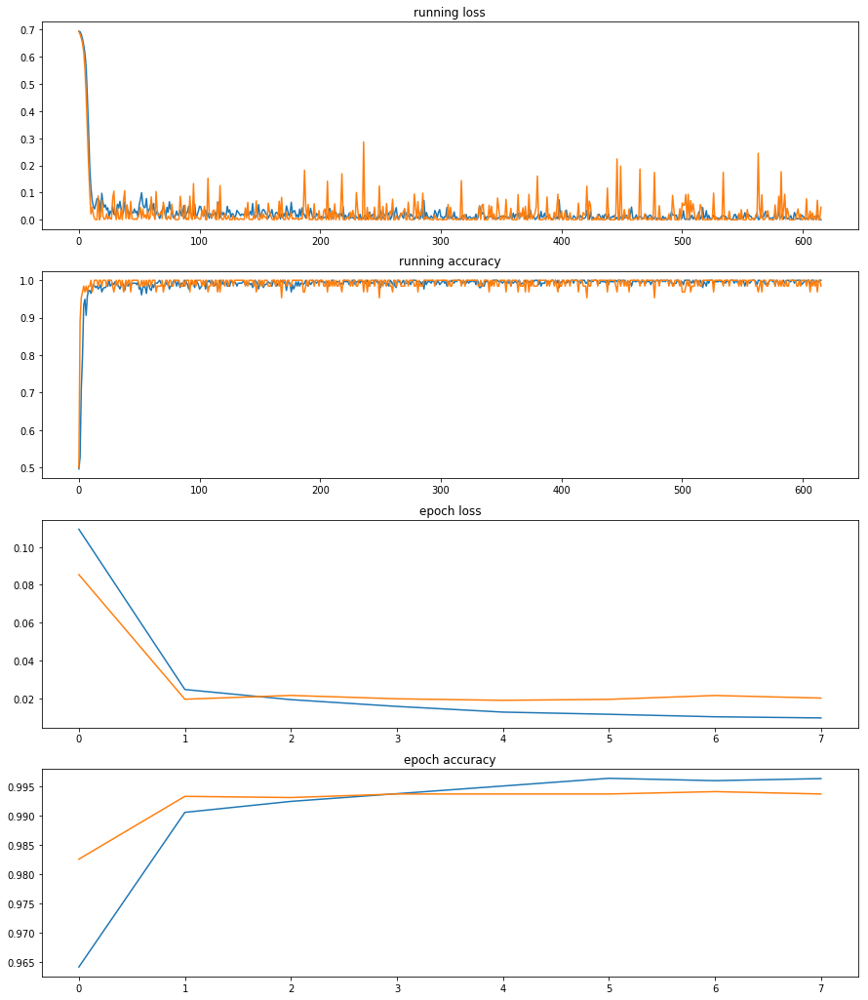

In [75]:
fig,ax=plt.subplots(4,1,figsize=(15,18))

ax[0].plot(running['loss']['train'])
ax[0].plot(running['loss']['valid'])
ax[0].set_title('running loss')

ax[1].plot(running['acc']['train'])
ax[1].plot(running['acc']['valid'])
ax[1].set_title('running accuracy')

ax[2].plot(epoch_dict['loss']['train'])
ax[2].plot(epoch_dict['loss']['valid'])
ax[2].set_title('epoch loss')

ax[3].plot(epoch_dict['acc']['train'])
ax[3].plot(epoch_dict['acc']['valid'])
ax[3].set_title('epoch accuracy')

In [ ]:
# torch.save(model.state_dict(),save_model)

In [39]:
# model.load_state_dict(torch.load('Net-5.pkl'))

三、预测测试集  

1、准备测试数据

In [40]:
test_dir=os.path.join(data_dir,'test')
test_images=os.listdir(test_dir)
test_sets=[(os.path.join(test_dir,fn),int(fn[:-4])) for fn in test_images] #test_sets数据类型为(image_path,ID)
test_size=len(test_sets)
print('test_sets: %d'%(test_size))

test_sets: 12500


2、预测图片是狗的概率

In [41]:
#创建一个空的带header的DataFrame
df=pd.DataFrame(columns=['id','label'])

#test
count=0
model.eval()
test_loader=torch.utils.data.DataLoader(test_sets,batch_size=100,num_workers=4)
for paths,ID in test_loader:
    inputs=batch_transform(paths,transform['test'])
    inputs=inputs.to(device)
    outputs=model(inputs)
    dog_probs=torch.nn.functional.softmax(outputs,dim=1).data[:,1] #图片是狗的概率
    df=df.append(pd.DataFrame({'id':ID,'label':dog_probs}),ignore_index=True)
    count+=1
    print('processing: %d/%d\r'%(count*100,test_size),end='')

3、预测结果可视化

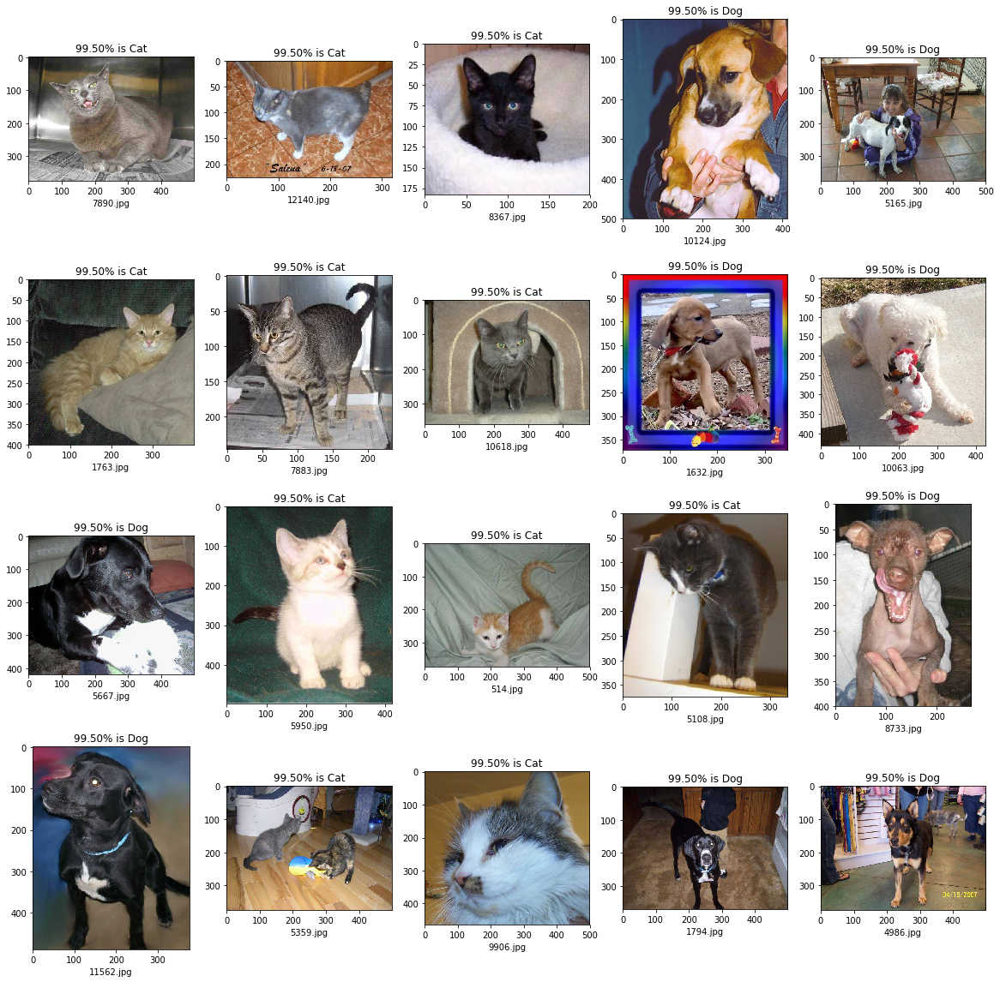

In [70]:
#抽样可视化预测结果。
from random import sample
samples=sample(range(test_size),20)
fig,axes=plt.subplots(4,5,figsize=(20,20))
for i in range(20):
    ax=axes[i//5,i%5]
    sampl=samples[i]
    dog_prob=df.loc[df.id==test_sets[sampl][1],'label'].item()
    if dog_prob<0.5:
        label='Cat'
        prob=1-dog_prob
    else:
        label='Dog'
        prob=dog_prob
    ax.imshow(Image.open(test_sets[sampl][0]))
    ax.set_xlabel(test_images[sampl])
    ax.set_title('%.2f%% is %s'%(prob*100,label))

4、依id排序，将预测概率df.label clip到[0.005,0.995]，将DataFrame写入csv文件。

In [42]:
csv_file='submission.csv'
df.sort_values(by='id',inplace=True)
df.label.clip(0.005,0.995,inplace=True)
df.to_csv(csv_file,index=False)
print(df)

          id     label
8485       1  0.995000
8403       2  0.995000
8316       3  0.995000
10466      4  0.995000
1464       5  0.005000
7874       6  0.005000
11042      7  0.005000
3874       8  0.005000
8647       9  0.005000
6454      10  0.005000
1070      11  0.005000
906       12  0.995000
11819     13  0.005000
10514     14  0.005000
9988      15  0.005000
1546      16  0.005000
2307      17  0.995000
11742     18  0.995000
12051     19  0.005000
3798      20  0.005000
10554     21  0.995000
5293      22  0.005000
8056      23  0.995000
9138      24  0.995000
11469     25  0.005000
8466      26  0.995000
4351      27  0.995000
4670      28  0.005000
10061     29  0.082660
3125      30  0.995000
...      ...       ...
9374   12471  0.995000
4655   12472  0.995000
10549  12473  0.005000
7234   12474  0.005000
607    12475  0.005000
1892   12476  0.995000
1311   12477  0.995000
2322   12478  0.995000
10705  12479  0.005000
3020   12480  0.005000
10582  12481  0.023944
6289   1248

5、提交 submission.csv 至 https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/submit 获取评分结果